# Plotly Tutorial 2020

[Link to Tutorial](https://www.youtube.com/watch?v=GGL6U0k8WYA)

[Plotly Colors](https://plotly.com/python/builtin-colorscales/)

## Import the required libraries

In [1]:
import pandas as pd
import numpy as np
import cufflinks as cf
import chart_studio.plotly as py
import seaborn as sns
import plotly.express as px

%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected =True)
cf.go_offline()

C:\Users\P\anaconda3\envs\py37\lib\importlib\_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

C:\Users\P\anaconda3\envs\py37\lib\importlib\_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

C:\Users\P\anaconda3\envs\py37\lib\importlib\_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject



## First Steps

<AxesSubplot:>

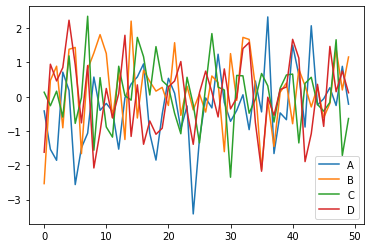

In [3]:
arr_1 = np.random.randn(50, 4)
df_1 = pd.DataFrame(arr_1, columns=["A", "B", "C", "D"])
df_1.head()

# Old Plot
df_1.plot()

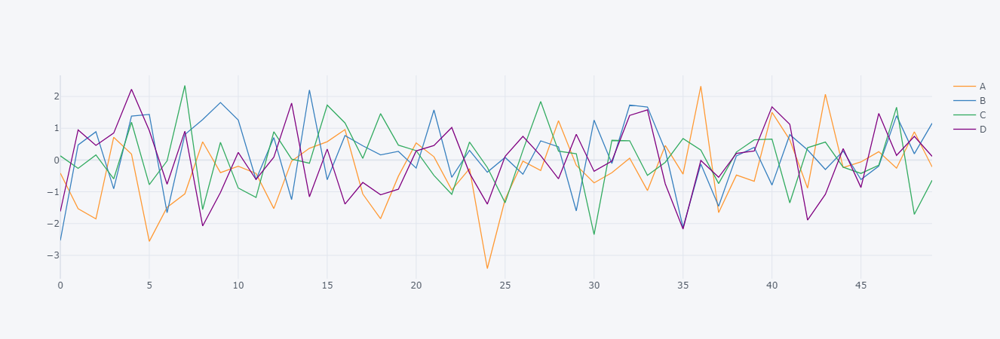

In [7]:
# Using iPlot
df_1.iplot()

## LINE PLOTS

In [8]:
import plotly.graph_objects as go

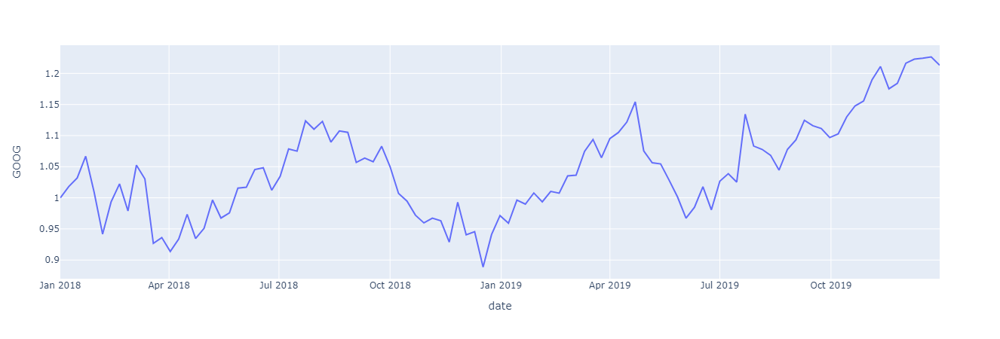

In [10]:
# data set built into plotly
df_stocks = px.data.stocks()


px.line(df_stocks, x='date', y='GOOG', labels = {'x' : 'Date', 'y': 'Price'})

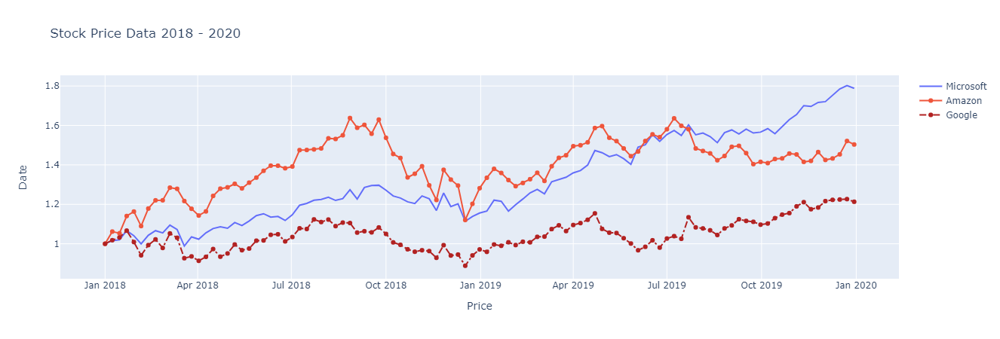

In [16]:
px.line(df_stocks, x = "date", y = ["MSFT", "AAPL"], 
       labels = {"x": "Date", "y": "Price"},
       title = "Apple vs Microsoft Stocks")

fig = go.Figure()
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.MSFT,
                        mode = 'lines', name = 'Microsoft'))
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.AMZN,
                        mode = 'lines+markers', name = 'Amazon'))
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.GOOG,
                        mode = 'lines+markers', name = 'Google',
                        line = dict(color='firebrick', width = 2,
                                   dash = 'dashdot')))
fig.update_layout(title = "Stock Price Data 2018 - 2020",
                 xaxis_title = "Price", yaxis_title = "Date")

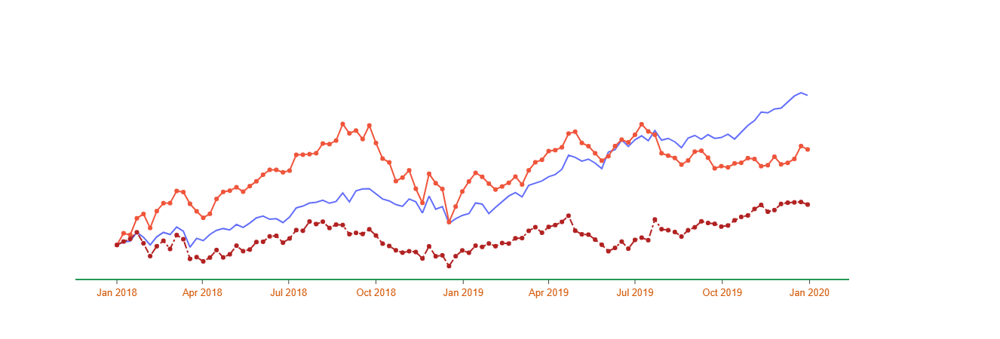

In [23]:
px.line(df_stocks, x = "date", y = ["MSFT", "AAPL"], 
       labels = {"x": "Date", "y": "Price"},
       title = "Apple vs Microsoft Stocks")

fig = go.Figure()
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.MSFT,
                        mode = 'lines', name = 'Microsoft'))
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.AMZN,
                        mode = 'lines+markers', name = 'Amazon'))
fig.add_trace(go.Scatter(x = df_stocks.date, y = df_stocks.GOOG,
                        mode = 'lines+markers', name = 'Google',
                        line = dict(color='firebrick', width = 2,
                                   dash = 'dashdot')))
fig.update_layout(
    xaxis=dict(
    showline = True, showgrid = False, showticklabels = True,
    linecolor = "#229954",
    linewidth = 2, ticks = "outside", tickfont = dict(
    family = "Arial", size = 13, color = "#D35400"
    ),
    ),  
    yaxis = dict(
    showgrid = False, zeroline=False, showline=False,
    showticklabels = False),
    autosize=False,
    margin = dict(
    autoexpand=False, l=100, r=200, t=110, ),
    showlegend=False, plot_bgcolor = 'white')

## BAR CHARTS

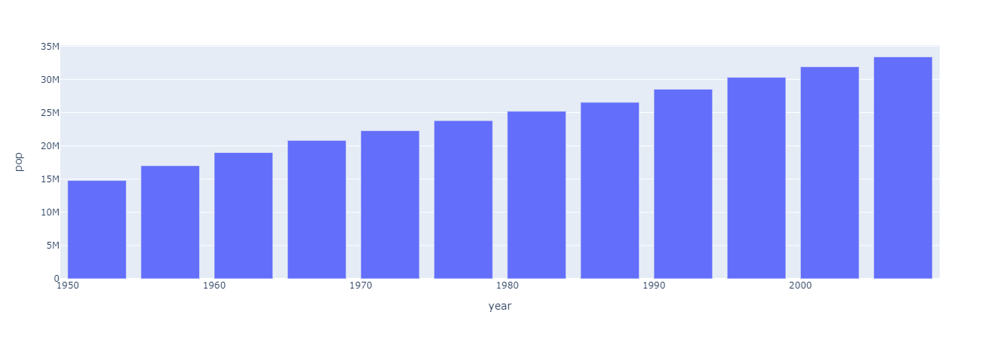

In [25]:
# Population changes in the US
df_can = px.data.gapminder().query("country == 'Canada'")
px.bar(df_can, x = "year", y = "pop")

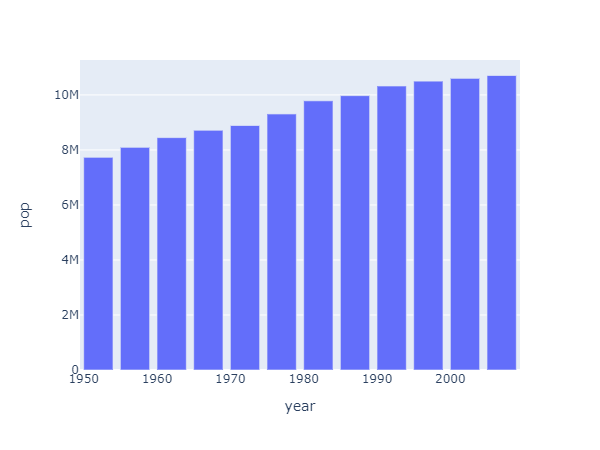

In [62]:
# Population changes in the US
df_gr = px.data.gapminder().query("country == 'Greece'")
px.bar(df_gr, x = "year", y = "pop")

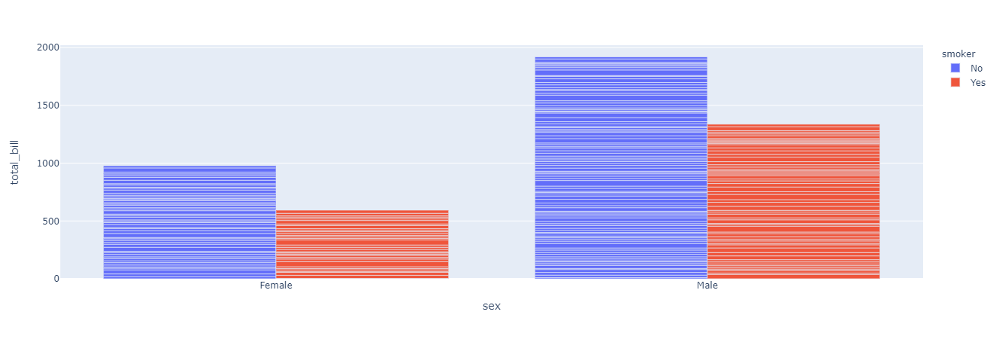

In [30]:
# Population changes in the US
df_gr = px.data.gapminder().query("country == 'Greece'")
px.bar(df_gr, x = "year", y = "pop")

df_tips = px.data.tips()
px.bar(df_tips, x = "day", y = "tip", color = "sex", 
      title = "Tips by Sex on Each Day",
      labels = {"tip": "Tip Amount", "day": "Day of the Week"})


# Second Style
px.bar(df_tips, x = "sex", y = "total_bill", color = "smoker",
       barmode = "group")

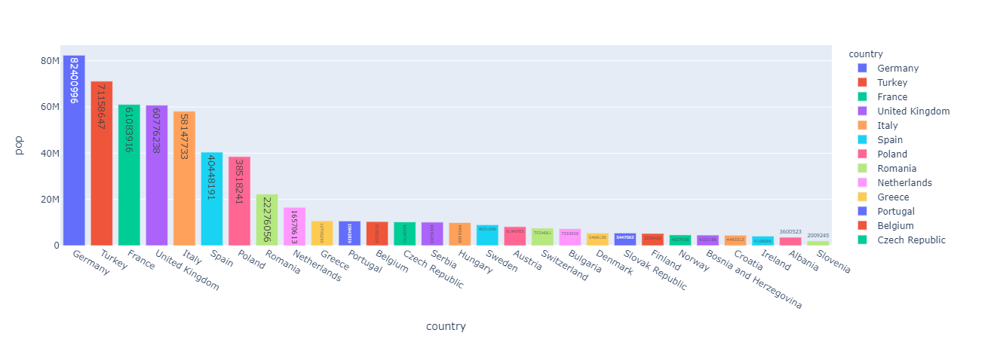

In [42]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
df_europe.sort_values(by = ['pop'], inplace=True, ascending=False)
fig = px.bar(df_europe, y = 'pop', x = 'country', text = 'pop', color = 'country')
fig

In [38]:
df_europe.columns

Index(['country', 'continent', 'year', 'lifeExp', 'pop', 'gdpPercap',
       'iso_alpha', 'iso_num'],
      dtype='object')

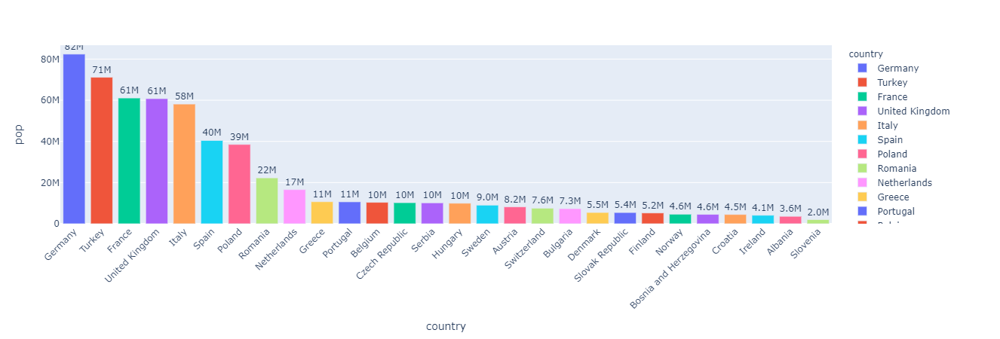

In [45]:
fig = px.bar(df_europe, y = 'pop', x = 'country', text = 'pop', color = 'country')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize = 8)
fig.update_layout(xaxis_tickangle=-45)

## Scatter Plot

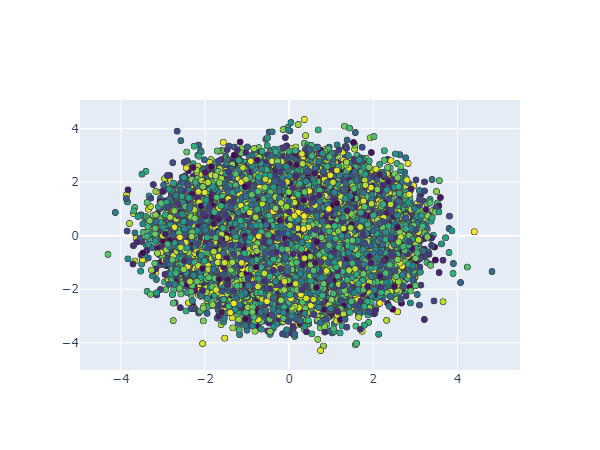

In [50]:
df_iris = px.data.iris()
px.scatter(df_iris, x = "sepal_width", y = "sepal_length", 
          color = "species", size = "petal_length",
          hover_data = ["petal_width"])

fig = go.Figure()
fig.add_trace(go.Scatter(
x = df_iris.sepal_width, y = df_iris.sepal_length,
mode = 'markers',
marker_color = df_iris.sepal_width,
text = df_iris.species,
marker = dict(showscale = True)))
fig.update_traces(marker_line_width = 2, marker_size = 10)

fig = go.Figure(data = go.Scattergl(
x = np.random.randn(100000),
y = np.random.randn(100000),
mode = 'markers',
marker = dict(
color=np.random.rand(100000),
colorscale= "Viridis",
line_width = 1)))
fig

## PIE CHARTS

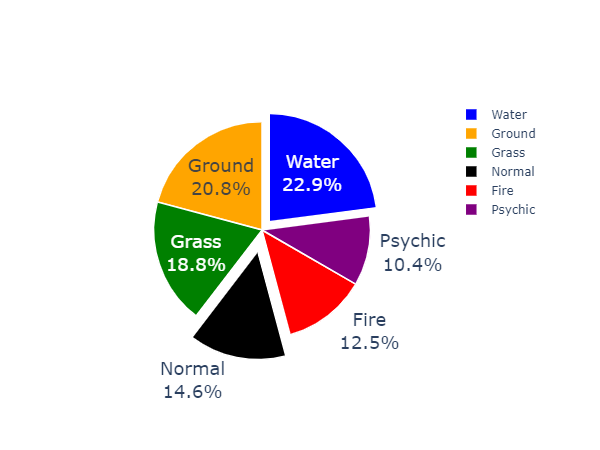

In [61]:
df_asia = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
px.pie(df_asia, values = 'pop', names = 'country',
      title = "Population of Asian Continent",
      color_discrete_sequence=px.colors.sequential.YlGn)

colors = ['blue', 'green', 'black', 'purple', 'red', 'orange']
fig = go.Figure(data = [go.Pie(labels = ["Water", "Grass", "Normal",
                                        "Psychic", "Fire", "Ground"],
                              values = [110, 90, 70, 50, 60, 100])])

fig.update_traces(hoverinfo = 'label+percent', textfont_size = 18,
                 textinfo='label+percent', 
                  pull = [0.1, 0, 0.2, 0, 0, 0],
                 marker=dict(colors=colors, line = dict(color = '#FFFFFF',
                                                       width = 1.5)))
fig

## HISTOGRAMS

In [69]:
df_tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


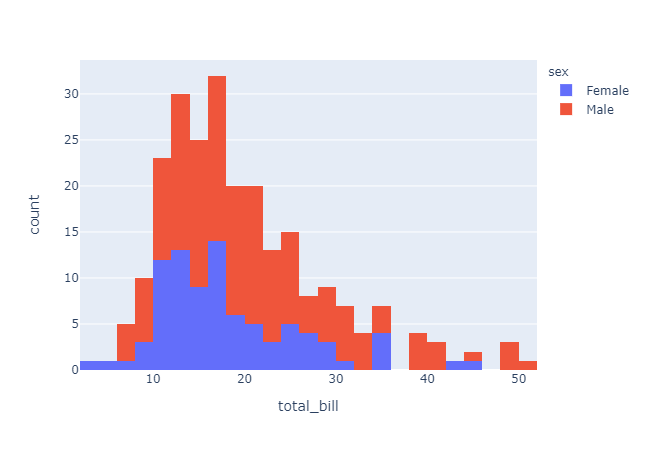

In [71]:
dice_1 = np.random.randint(1, 7, 5000)
dice_2 = np.random.randint(1, 7, 5000)

dice_sum = dice_1 + dice_2
fig = px.histogram(dice_sum, nbins = 11, 
                   labels = {'value' : "Dice Roll"},
                  title = "5000 Dice Roll Histogram", 
                  marginal = 'violin',
                  color_discrete_sequence=['lightblue'])
fig.update_layout(
xaxis_title_text = "Dice Roll",
yaxis_title_text = "Dice Sum",
bargap = 0.1, showlegend=False)

# to stack a histtogram on top of another
px.histogram(df_tips, x = 'total_bill', color='sex')


## BOX PLOTS

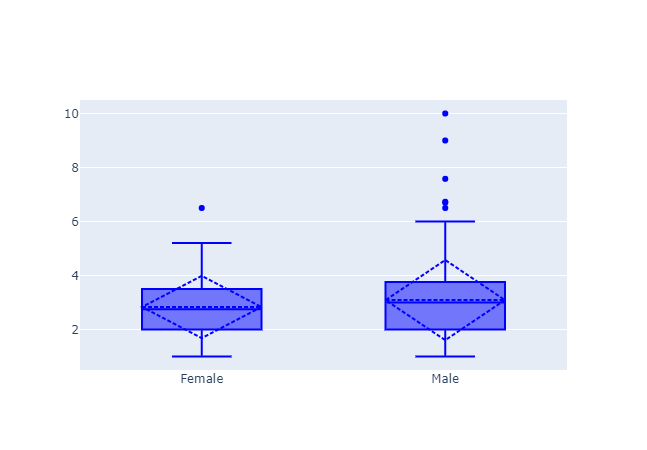

In [78]:
px.box(df_tips, x = 'sex', y = 'tip', points = 'all')

px.box(df_tips, x = 'day', y = 'tip', color='sex')

fig = go.Figure()
fig.add_trace(go.Box(x = df_tips.sex, y = df_tips.tip, 
              marker_color="blue",
              boxmean = 'sd'))

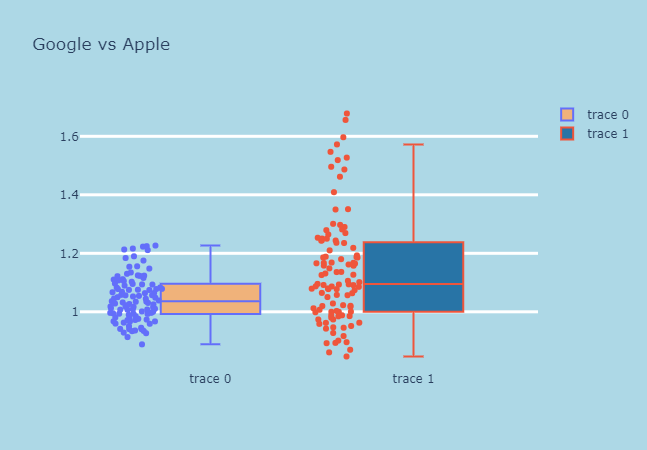

In [84]:
fig = go.Figure()
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all',
                    fillcolor='#F0B27A', jitter=0.6,
                    whiskerwidth = 0.2))

fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all',
                    fillcolor='#2874A6', jitter=0.6,
                    whiskerwidth = 0.2))

fig.update_layout(title = "Google vs Apple",
                 yaxis = dict(gridcolor='white',
                             gridwidth = 3),
                 paper_bgcolor = 'lightblue',
                  plot_bgcolor = 'lightblue')

## VIOLIN PLOT

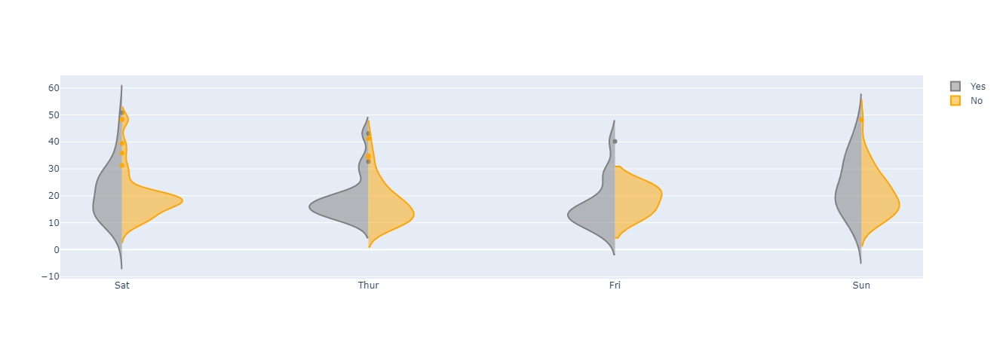

In [96]:
px.violin(df_tips, y = 'total_bill', box = True, points = 'all')

# Multiple PLots
px.violin(df_tips, y = 'tip', x = 'smoker', color='sex', box=True,
          points = 'all', hover_data = df_tips.columns )


# More Complicated
fig = go.Figure()
fig.add_trace(go.Violin(x = df_tips['day'][df_tips['smoker'] == 'Yes'],
                       y = df_tips['total_bill'][df_tips['smoker'] == 'Yes'],
                       legendgroup = 'Yes', scalegroup = 'Yes', name = 'Yes',
                       side = 'negative', line_color = 'grey'))
fig.add_trace(go.Violin(x = df_tips['day'][df_tips['smoker'] == 'No'],
                       y = df_tips['total_bill'][df_tips['smoker'] == 'No'],
                       legendgroup = 'Yes', scalegroup = 'Yes', name = 'No',
                       side = 'positive', line_color = 'orange'))

## Density Heatmaps

In [97]:
flights = sns.load_dataset("flights")
flights.head()

# set bins nbinsx or nbinsy

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121


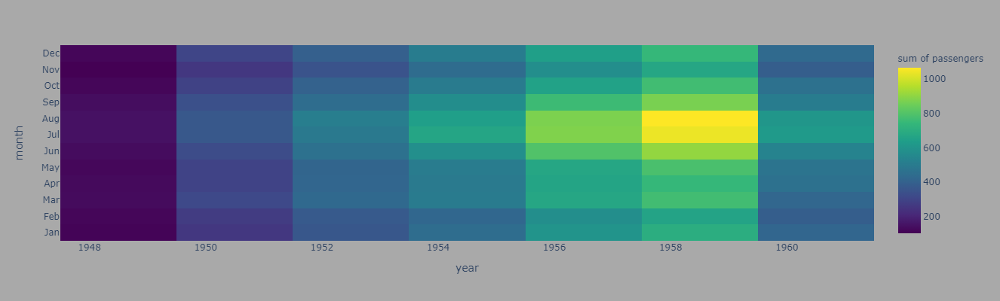

In [112]:
fig = px.density_heatmap(flights, x = 'year', y = 'month',
                        z = 'passengers',
                        color_continuous_scale='Viridis',
                        width=500, height=400)
fig.update_layout(paper_bgcolor = 'darkgrey')
fig

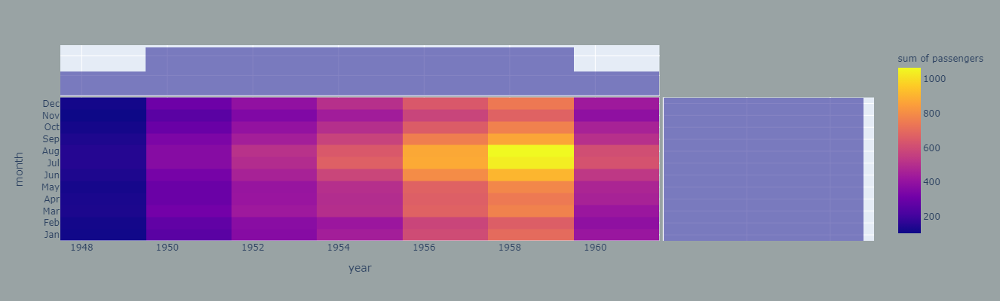

In [113]:
fig = px.density_heatmap(flights, x = 'year', y = 'month',
                        z = 'passengers',
                        width=500, height=400,
                        marginal_x = 'histogram',
                        marginal_y = 'histogram')
fig.update_layout(paper_bgcolor = '#99A3A4')
fig

## 3D SCATTPLOT

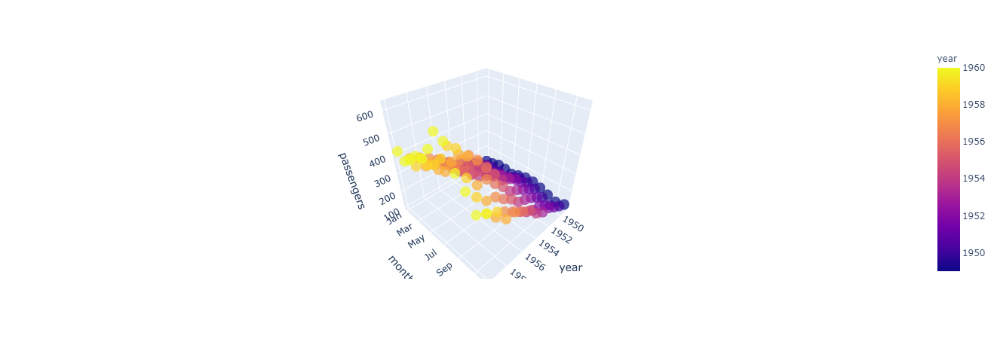

In [116]:
fig = px.scatter_3d(flights, x = 'year', y = 'month', z = 'passengers',
                   color = 'year', opacity = 0.7)
fig

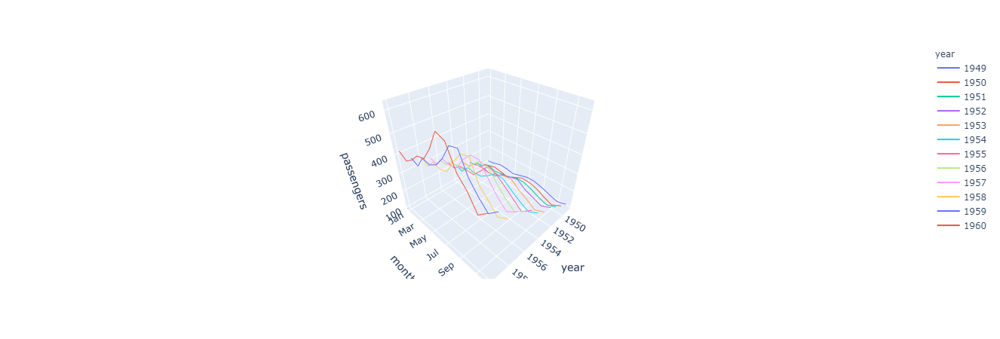

In [118]:
fig = px.line_3d(flights, x = 'year', y = 'month', z = 'passengers',
                   color = 'year')
fig

## SCATTER MATRIX

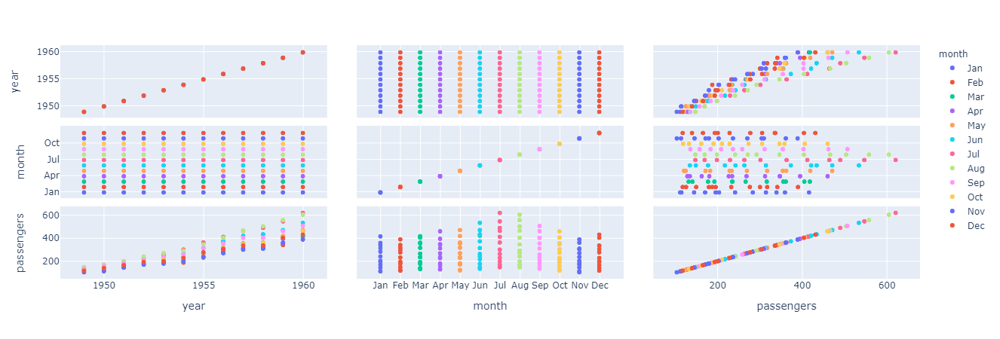

In [119]:
fig = px.scatter_matrix(flights, color = 'month')
fig

## MAP SCATTER PLOT

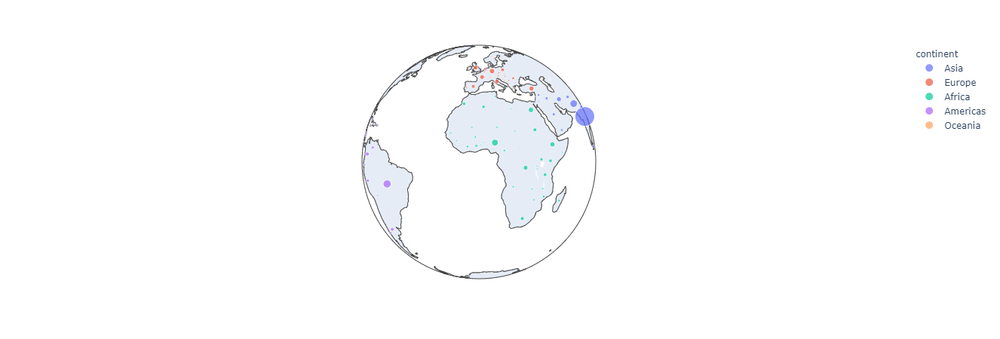

In [123]:
df = px.data.gapminder().query("year == 2007")
fig = px.scatter_geo(df, locations = "iso_alpha",
                    color= 'continent',
                    hover_name = 'country',
                    size = 'pop',
                    projection = 'orthographic')
fig